In [1]:
import sys
import os
import pathlib
import pandas as pd
import seaborn as sns
import numpy as np
import logging


from sklearn.model_selection import TimeSeriesSplit
from sklearn.metrics import mean_absolute_error
from prophet import Prophet

logger = logging.getLogger('cmdstanpy')
logger.addHandler(logging.NullHandler())
logger.propagate = False
logger.setLevel(logging.CRITICAL)

PROJECT_FOLDER = pathlib.Path(os.getcwd()).resolve().parent
sys.path.append(str(PROJECT_FOLDER / 'src'))
from utils.dataset_utils import DatasetUtils
from utils.forecast_utils import ForecastUtils
from forecasters.baseline_forecasters import WhiteNoiseForecaster, MeanForecaster

/home/migisen/Study/misis-dshack/.venv/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
Importing plotly failed. Interactive plots will not work.


# Прогноз акций на примере SBER

## Конфиг

In [2]:
PATH_TO_STOCKS = PROJECT_FOLDER / 'data' / 'SBER_210111_230531.csv'
TRAIN_SIZE = 0.9
RANDOM_STATE = 42
X_PERIODS = 128 * 14
Y_PERIODS = 8

X_PERIODS_DAILY = 128
Y_PERIODS_DAILY = 7


forecast_utils = ForecastUtils()

## Загрузка данных

In [3]:
dataset_utils = DatasetUtils()
hourly_sber_stocks = dataset_utils.get_hourly_df(PATH_TO_STOCKS)
daily_sber_stocks = dataset_utils.get_daily_df(PATH_TO_STOCKS)

## Разделение данных на обучающую и тестовую выборку

In [4]:
# ts_split = TimeSeriesSplit(
#     n_splits=2,
#     test_size=TEST_SIZE
# )

# X_train_h, X_test_h, y_train_h, y_test_h = ts_split.split(
#     hourly_sber_stocks[['<CLOSE>']]
#     )
divider_idx = round(len(hourly_sber_stocks) * TRAIN_SIZE)
X_train, y_test = hourly_sber_stocks[['<CLOSE>']][:divider_idx], hourly_sber_stocks[divider_idx:]

## Baseline прогнозы

### Прогнозирование белым шумом

#### Прогнозирование скользящим окном

In [5]:
wn_forecaster = WhiteNoiseForecaster()

In [6]:
mae_list = []
for X_train, y_test in forecast_utils.generate_rolling_window(hourly_sber_stocks[['<CLOSE>']], 'test', X_PERIODS, Y_PERIODS, offset=1):
    wn_forecaster.fit(X_train, 'hourly')
    y_preds = wn_forecaster.predict(Y_PERIODS)
    mae_list.append(mean_absolute_error(y_test['<CLOSE>'],y_preds))

print(f'MAE = {np.mean(mae_list)}')

Total steps: 5991
MAE = 54.876162242144616


### Прогнозирование средним значением ряда

#### Модель

In [7]:
mean_forecaster = MeanForecaster()

#### Скользящее окно

In [8]:
for X_train, y_test in forecast_utils.generate_rolling_window(hourly_sber_stocks[['<CLOSE>']], 'test', X_PERIODS, Y_PERIODS, offset=1):
    mean_forecaster.fit(X_train, 'hourly')
    y_preds = mean_forecaster.predict(Y_PERIODS)
    mae_list.append(mean_absolute_error(y_test['<CLOSE>'], y_preds))

print(f'MAE = {np.mean(mae_list)}')

Total steps: 5991
MAE = 52.54111089825297


## Prophet

#### Модель и данные

In [9]:
prophet_df = hourly_sber_stocks[['<CLOSE>']].copy()
prophet_df.reset_index(drop=False, inplace=True)
prophet_df.columns = ['ds', 'y']

#### Скользящее окно

In [10]:
mae_list = []
for X_train, y_test in forecast_utils.generate_rolling_window(prophet_df, 'test', X_PERIODS, Y_PERIODS, offset=1):
    prophet_forecaster = Prophet()
    prophet_forecaster.fit(X_train)
    future = prophet_forecaster.make_future_dataframe(periods=Y_PERIODS * 10, freq = 'H', include_history=False)
    forecast = prophet_forecaster.predict(future)[['ds', 'yhat']]
    forecast.columns = ['ds', 'y_pred_prophet']
    # forecast.set_index('ds', inplace=True)
    y_test = y_test.merge(forecast, on='ds')  
    mae_list.append(mean_absolute_error(y_test['y'], y_test['y_pred_prophet']))

print(f'MAE = {np.mean(mae_list)}')

Total steps: 5991


KeyboardInterrupt: 

# Прогнозирование дневных данных

## Белый шум

In [11]:
wn_forecaster = WhiteNoiseForecaster()

In [15]:
mae_list = []
for X_train, y_test in forecast_utils.generate_rolling_window(daily_sber_stocks[['<CLOSE>']], 'test', X_PERIODS_DAILY, Y_PERIODS_DAILY, offset=1):
    wn_forecaster.fit(X_train, 'daily')
    y_preds = wn_forecaster.predict(Y_PERIODS_DAILY)
    mae_list.append(mean_absolute_error(y_test['<CLOSE>'], y_preds))

print(f'MAE = {np.mean(mae_list)}')

Total steps: 557
MAE = 46.969049284870366


## Среднее значение

In [16]:
mean_forecaster = MeanForecaster()

In [18]:
for X_train, y_test in forecast_utils.generate_rolling_window(daily_sber_stocks[['<CLOSE>']], 'test', X_PERIODS_DAILY, Y_PERIODS_DAILY, offset=1):
    mean_forecaster.fit(X_train, 'daily')
    y_preds = mean_forecaster.predict(Y_PERIODS_DAILY)
    mae_list.append(mean_absolute_error(y_test['<CLOSE>'], y_preds))

print(f'MAE = {np.mean(mae_list)}')

Total steps: 557
MAE = 45.07411877915293


## Prophet

In [19]:
prophet_df_daily = daily_sber_stocks[['<CLOSE>']].copy()
prophet_df_daily.reset_index(drop=False, inplace=True)
prophet_df_daily.columns = ['ds', 'y']

Total steps: 557


/home/migisen/Study/misis-dshack/.venv/lib/python3.11/site-packages/prophet/plot.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure(facecolor='w', figsize=figsize)


KeyboardInterrupt: 

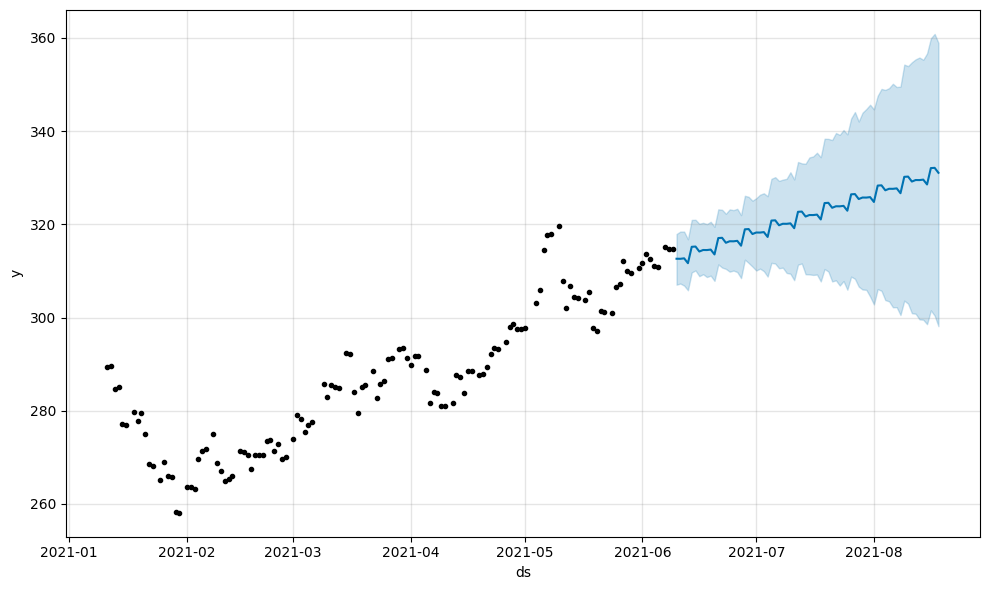

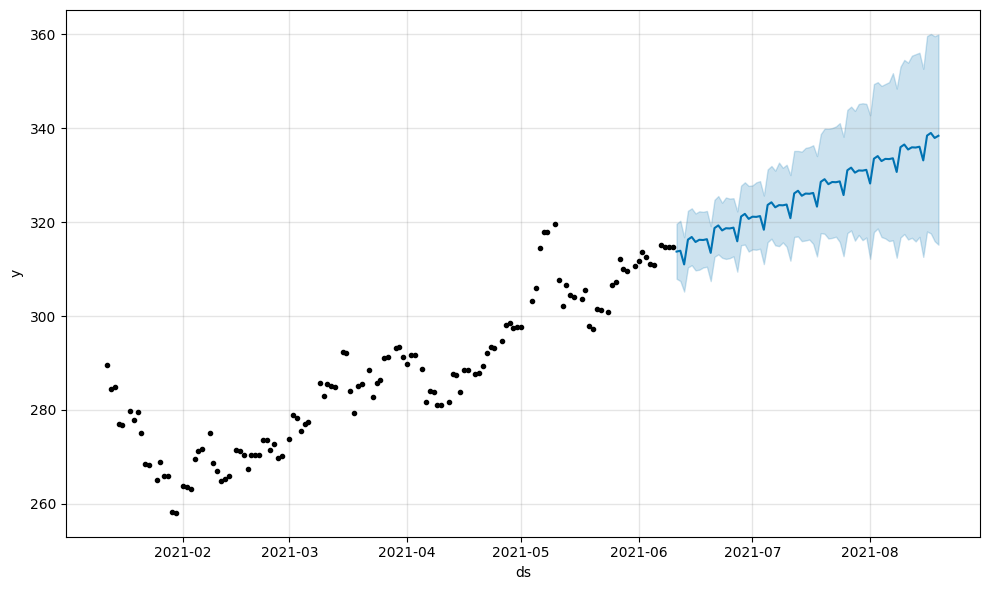

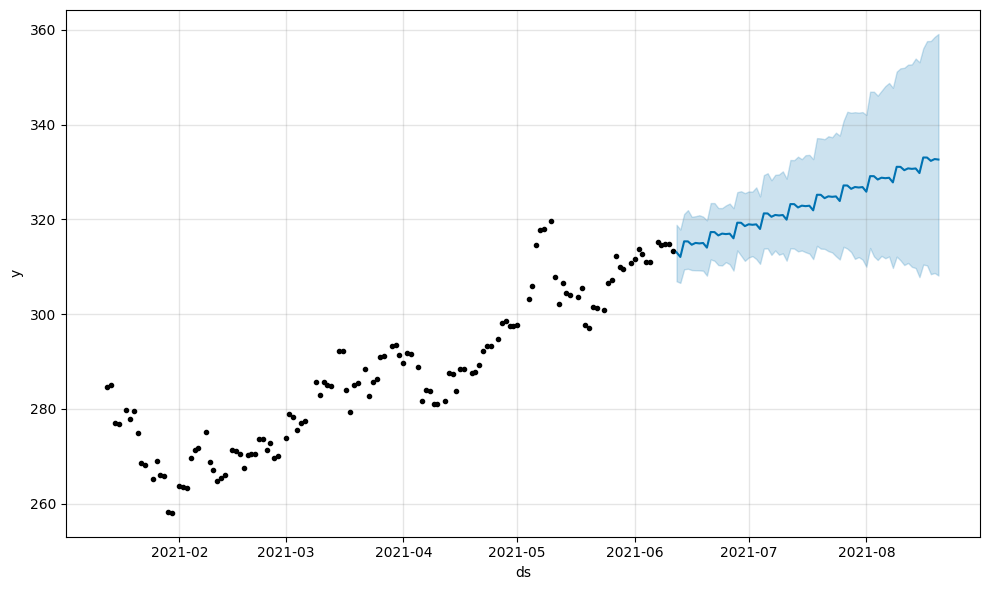

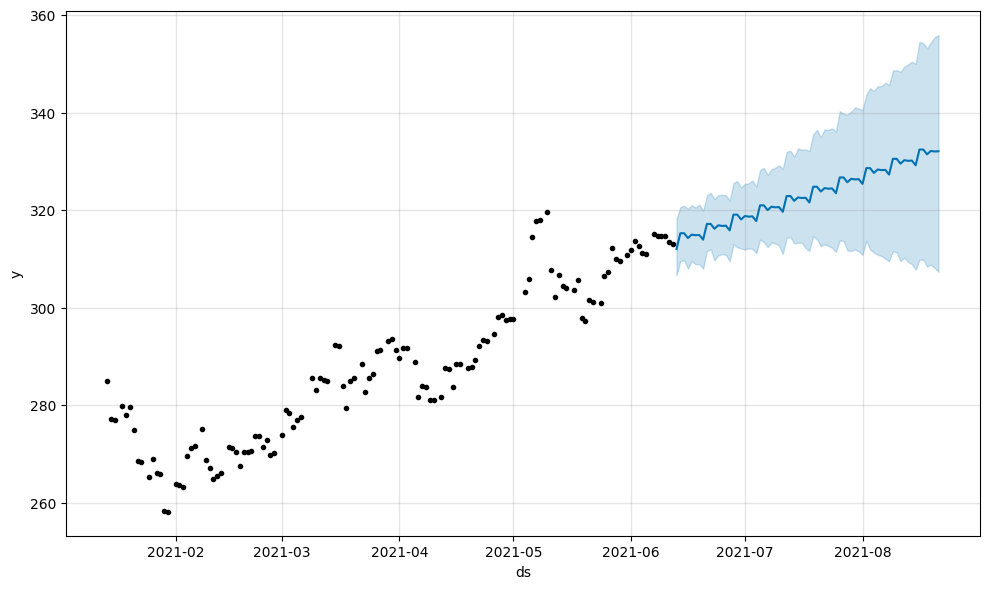

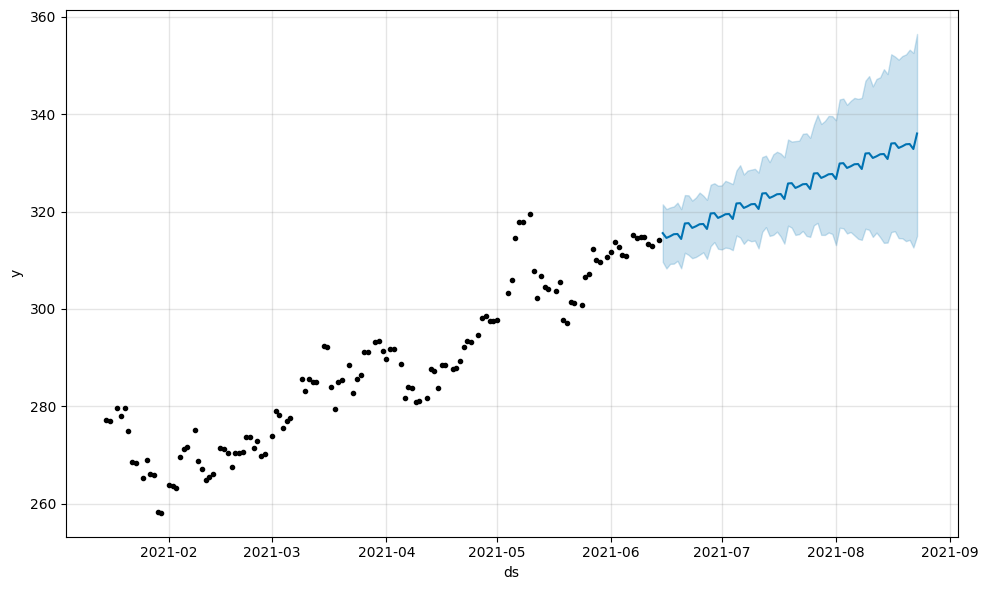

...

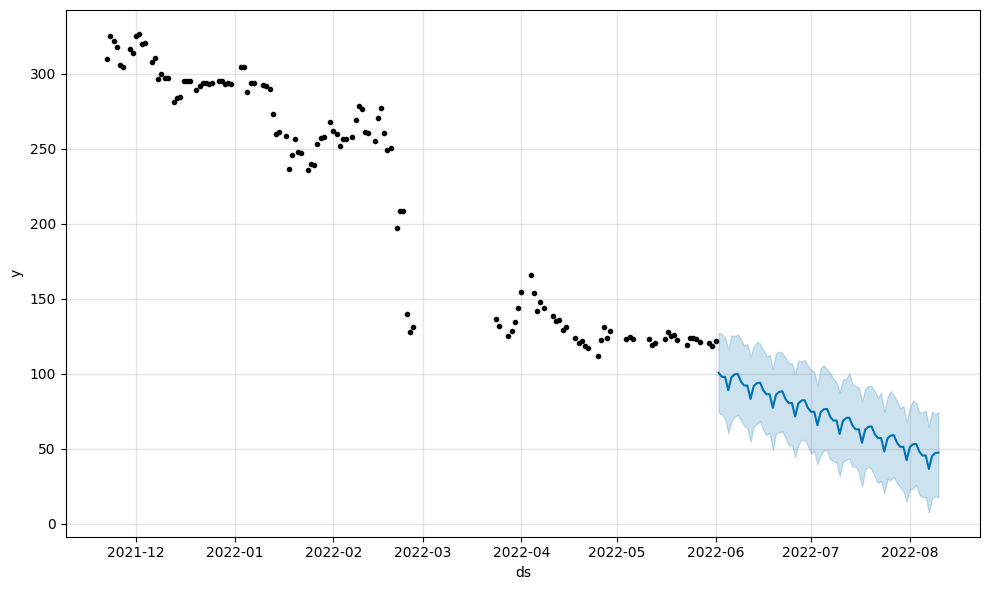

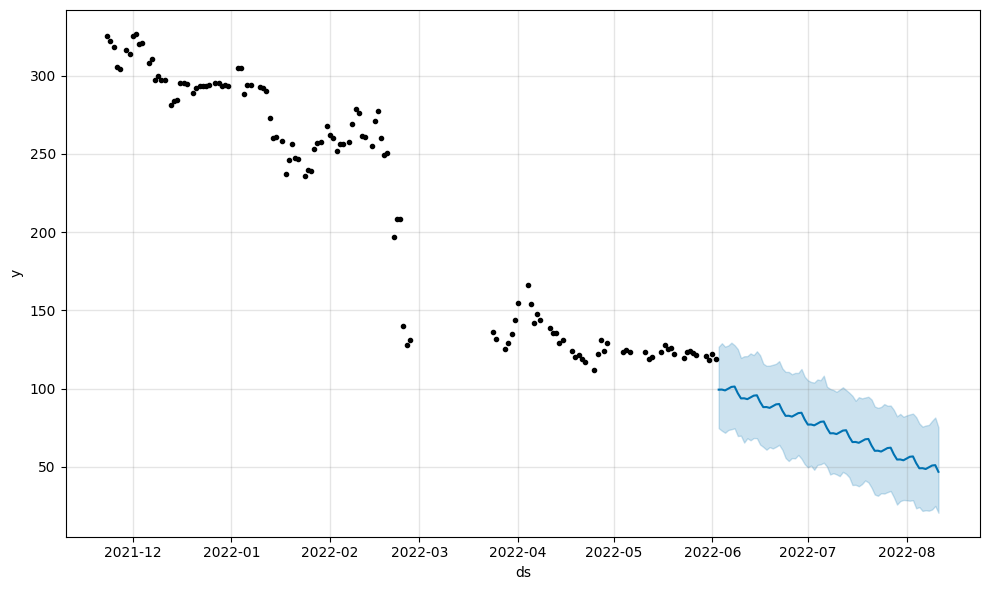

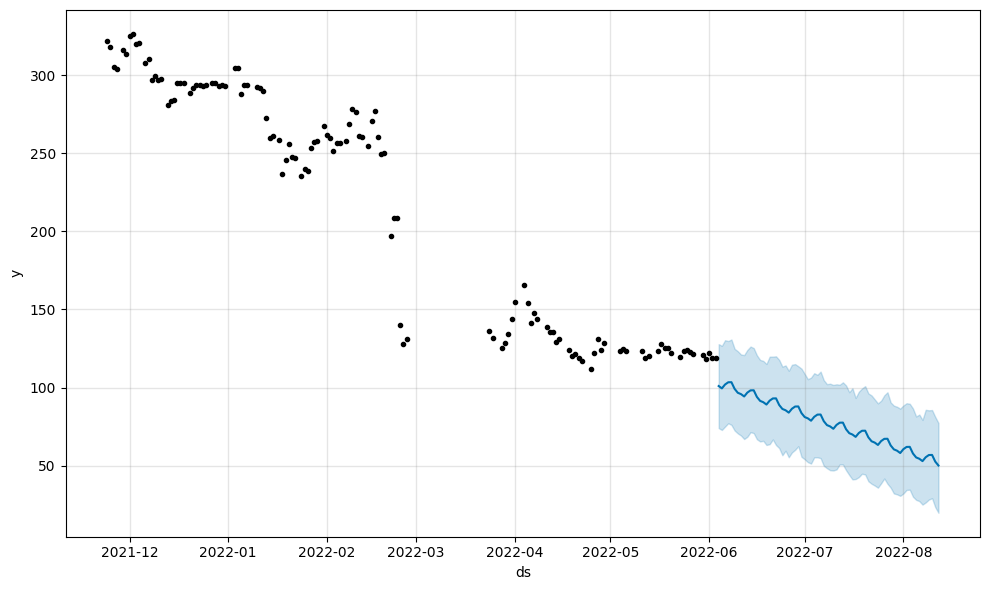

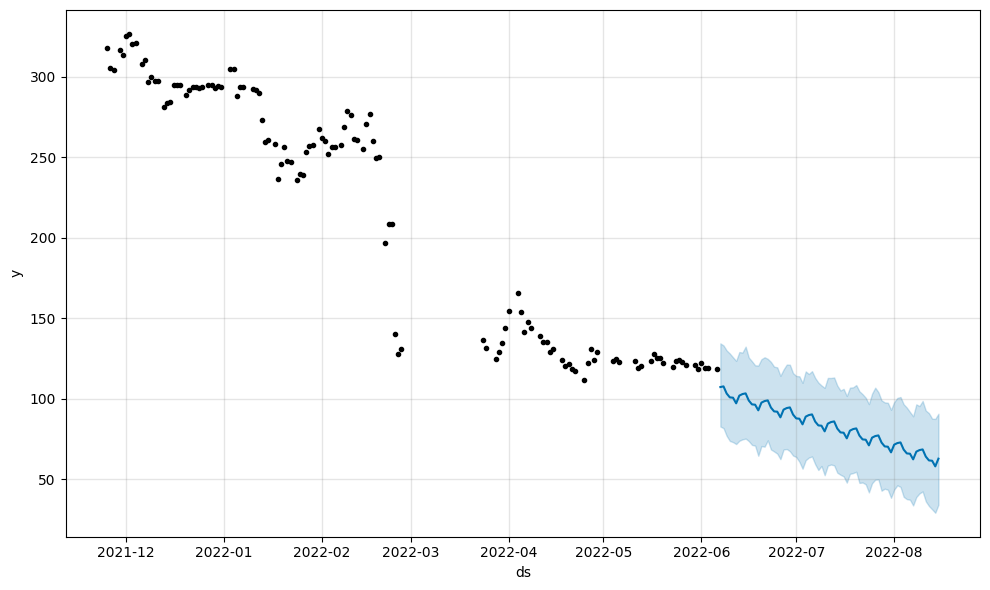

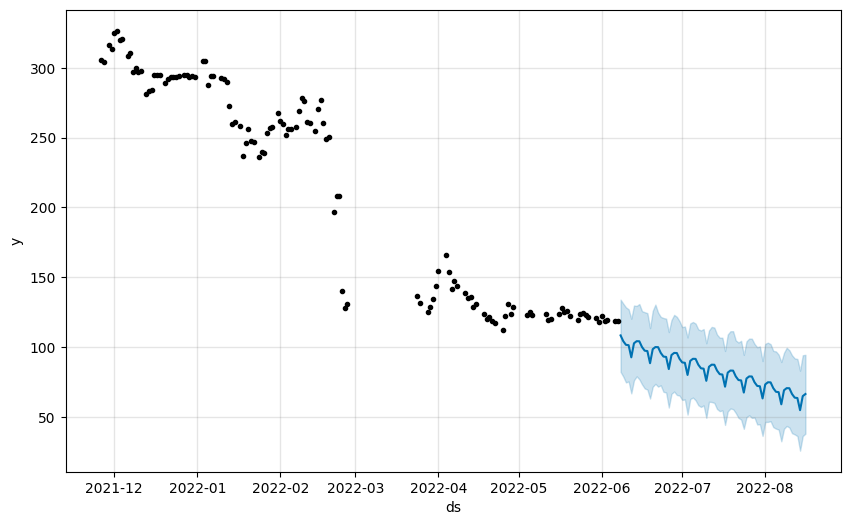

In [26]:
mae_list = []
for X_train, y_test in forecast_utils.generate_rolling_window(prophet_df_daily, 'test', X_PERIODS_DAILY, Y_PERIODS_DAILY, offset=1):
    prophet_forecaster = Prophet()
    prophet_forecaster.fit(X_train)
    future = prophet_forecaster.make_future_dataframe(periods=Y_PERIODS_DAILY * 10, freq = 'D', include_history=False)
    forecast = prophet_forecaster.predict(future)
    prophet_forecaster.plot(forecast)
    forecast = forecast[['ds', 'yhat']]
    forecast.columns = ['ds', 'y_pred_prophet']
    # forecast.set_index('ds', inplace=True)
    y_test = y_test.merge(forecast, on='ds')  
    mae_list.append(mean_absolute_error(y_test['y'], y_test['y_pred_prophet']))

print(f'MAE = {np.mean(mae_list)}')